# **COVID19 - Analysis, Interactive Visualizations and Predictions in Germany**

![Covid19](https://upload.wikimedia.org/wikipedia/commons/thumb/9/96/3D_medical_animation_coronavirus_structure.jpg/1200px-3D_medical_animation_coronavirus_structure.jpg)
Image credits: [Wikimedia.org](http://commons.wikimedia.org/)

## Introduction to COVID19
Coronavirus disease 2019 (COVID‑19) is an infectious disease caused by **severe acute respiratory syndrome coronavirus 2 (SARS-CoV-2)**. It was first identified in **December 2019** in **Wuhan**, Hubei, China, and has resulted in an ongoing pandemic. As of 8 November 2020, more than **49.9 million cases** have been reported across 188 countries and territories with more than **1,250,000 deaths**; more than 32.8 million people have recovered.<br>
## How COVID19 Spreads
![COVID19-spreading](https://www.lavision.de/cms_images/news/bos-covid19.gif?m=1585647199)
Image credits: [Lavision.de](https://www.lavision.de/en/news/2020/4302/)
The virus is spread primarily via **small droplets from coughing, sneezing, and talking**. The droplets are usually not airborne; however, those standing in close proximity may inhale them and become infected. People may also become infected by touching a contaminated surface and then touching their face. The transmission may also occur through aerosols that can stay suspended in the air for longer periods of time in enclosed spaces. It is most contagious during the first three days after the onset of symptoms, although spread is possible before symptoms appear, and from people who are asymptomatic. <br>
## COVID19 Diagnosis
![COVID19-diagnosis](https://upload.wikimedia.org/wikipedia/commons/thumb/a/a6/Covid-19-Time-Course-05.gif/525px-Covid-19-Time-Course-05.gif)
Image credits: [Wikipedia.org](https://en.wikipedia.org/wiki/COVID-19_testing)
The standard method of diagnosis is by **real-time reverse transcription polymerase chain reaction (rRT-PCR)** from a nasopharyngeal swab. Chest CT imaging may also be helpful for diagnosis in individuals where there is a high suspicion of infection based on symptoms and risk factors, however guidelines do not recommend using it for routine.screening.
## How can we stop COVID19
![COVID19-stop](https://upload.wikimedia.org/wikipedia/commons/thumb/c/c5/Covid-19-curves-graphic-social-v3.gif/1200px-Covid-19-curves-graphic-social-v3.gif)
Image credit: [Wikimedia.org](https://commons.wikimedia.org/wiki/File:Covid-19-curves-graphic-social-v3.gif)
To prevent the spread of COVID-19:
* **Clean your hands** often. Use soap and water, or an alcohol-based hand rub.
* Maintain a safe distance from anyone who is coughing or sneezing.
* **Wear a mask** when physical distancing is not possible.
* **Don’t touch** your eyes, nose or mouth.
* Cover your nose and mouth with your bent elbow or a tissue when you cough or sneeze.
* **Stay home** if you feel unwell.
* If you have a fever, cough and difficulty breathing, seek medical attention.




# Importing Packages

* Pandas - for handling datasets
* Numpy - for operations on dataframes
* Plotly - for creating visualizations
* Scikit-learn - for creating models

In [91]:
import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

#Plotly Libraris
import matplotlib.pyplot as plt
import plotly.express as px
import plotly.graph_objects as go
#import plotly.figure_factory as ff
#from plotly.colors import n_colors
from plotly.subplots import make_subplots
# Minmax scaler
from sklearn.preprocessing import MinMaxScaler

#itertools
import itertools

#dataframe display settings
pd.set_option('display.max_columns', 5000000)
pd.set_option('display.max_rows', 50000000)

#to suppress un-necessary warnings
import warnings  
warnings.filterwarnings('ignore')

# Importing Data

In [92]:
covid_df = pd.read_csv('datasets/covid_de.csv')
demographics_df = pd.read_csv('datasets/demographics_de.csv')

In [93]:
covid_df.head()

,state,county,age_group,gender,date,cases,deaths,recovered
0,Baden-Wuerttemberg,LK Alb-Donau-Kreis,00-04,F,2020-03-27,1,0,1
1,Baden-Wuerttemberg,LK Alb-Donau-Kreis,00-04,F,2020-03-28,1,0,1
2,Baden-Wuerttemberg,LK Alb-Donau-Kreis,00-04,F,2020-04-03,1,0,1
3,Baden-Wuerttemberg,LK Alb-Donau-Kreis,00-04,F,2020-10-18,1,0,0
4,Baden-Wuerttemberg,LK Alb-Donau-Kreis,00-04,F,2020-10-22,1,0,0


In [94]:
covid_df.isnull().sum()

state           0
county          0
age_group    1221
gender       2833
date            0
cases           0
deaths          0
recovered       0
dtype: int64

# Time Series of Basic Stats

In [95]:
covid_df["Active"] = covid_df["cases"]-(covid_df["deaths"]+covid_df["recovered"])

In [96]:
covid_df.groupby("date").agg({"cases":"sum","deaths":"sum","recovered":"sum","Active":"sum"}).head(10)

,cases,deaths,recovered,Active
date,,,,
2020-01-03,1,0,1,0
2020-01-28,2,0,2,0
2020-01-29,2,0,2,0
2020-01-31,6,0,6,0
2020-02-03,1,0,1,0
2020-02-04,4,0,4,0
2020-02-06,1,0,1,0
2020-02-07,1,0,1,0
2020-02-11,2,0,2,0


In [97]:
covid_df.groupby("date").agg({"cases":"sum","deaths":"sum","recovered":"sum","Active":"sum"}).tail(10)

,cases,deaths,recovered,Active
date,,,,
2020-10-28,19167,68,3559,15540
2020-10-29,19762,59,2842,16861
2020-10-30,19310,49,1920,17341
2020-10-31,13956,38,953,12965
2020-11-01,10536,18,499,10019
2020-11-02,15062,41,692,14329
2020-11-03,18780,34,501,18245
2020-11-04,20125,23,322,19780
2020-11-05,19747,19,233,19495


In [98]:
covid_df.groupby("date").agg({"cases":"sum","deaths":"sum","recovered":"sum","Active":"sum"}).tail(10)

,cases,deaths,recovered,Active
date,,,,
2020-10-28,19167,68,3559,15540
2020-10-29,19762,59,2842,16861
2020-10-30,19310,49,1920,17341
2020-10-31,13956,38,953,12965
2020-11-01,10536,18,499,10019
2020-11-02,15062,41,692,14329
2020-11-03,18780,34,501,18245
2020-11-04,20125,23,322,19780
2020-11-05,19747,19,233,19495


In [99]:
covid_df.groupby(["date","state"]).agg({"cases":"sum","deaths":"sum","recovered":"sum","Active":"sum"}).head(10)

cases  deaths  recovered  Active
date       state                                               
2020-01-03 Baden-Wuerttemberg      1       0          1       0
2020-01-28 Bayern                  2       0          2       0
2020-01-29 Bayern                  2       0          2       0
2020-01-31 Bayern                  5       0          5       0
           Saarland                1       0          1       0
2020-02-03 Bayern                  1       0          1       0
2020-02-04 Bayern                  3       0          3       0
           Niedersachsen           1       0          1       0
2020-02-06 Bayern                  1       0          1       0
2020-02-07 Bayern                  1       0          1       0

In [100]:
covid_df.groupby(["date","state","county"]).agg({"cases":"sum","deaths":"sum","recovered":"sum","Active":"sum"}).head(10)

cases  deaths  recovered  \
date       state              county                                           
2020-01-03 Baden-Wuerttemberg LK Karlsruhe              1       0          1   
2020-01-28 Bayern             LK Landsberg a.Lech       1       0          1   
                              LK Starnberg              1       0          1   
2020-01-29 Bayern             LK Fuerstenfeldbruck      1       0          1   
                              SK Muenchen               1       0          1   
2020-01-31 Bayern             LK Fuerstenfeldbruck      1       0          1   
                              LK Starnberg              2       0          2   
                              LK Traunstein             2       0          2   
           Saarland           LK Neunkirchen            1       0          1   
2020-02-03 Bayern             SK Muenchen               1       0          1   

                                                    Active  
date       state              county                        
2020-01-03 Baden-Wuerttemberg LK Karlsruhe               0  
2020-01-28 Bayern             LK Landsberg a.Lech        0  
                              LK Starnberg               0  
2020-01-29 Bayern             LK Fuerstenfeldbruck       0  
                              SK Muenchen                0  
2020-01-31 Bayern             LK Fuerstenfeldbruck       0  
                              LK Starnberg               0  
                              LK Traunstein              0  
           Saarland           LK Neunkirchen             0  
2020-02-03 Bayern             SK Muenchen                0

In [101]:
covid_df.groupby(["date","state","county","age_group","gender"]).agg({"cases":"sum","deaths":"sum","recovered":"sum","Active":"sum"}).head(10)

cases  \
date       state              county               age_group gender          
2020-01-03 Baden-Wuerttemberg LK Karlsruhe         35-59     F           1   
2020-01-28 Bayern             LK Landsberg a.Lech  15-34     M           1   
                              LK Starnberg         35-59     M           1   
2020-01-29 Bayern             LK Fuerstenfeldbruck 15-34     M           1   
                              SK Muenchen          15-34     F           1   
2020-01-31 Bayern             LK Fuerstenfeldbruck 35-59     M           1   
                              LK Starnberg         35-59     F           1   
                                                             M           1   
                              LK Traunstein        00-04     F           1   
                                                   35-59     M           1   

                                                                     deaths  \
date       state              county               age_group gender           
2020-01-03 Baden-Wuerttemberg LK Karlsruhe         35-59     F            0   
2020-01-28 Bayern             LK Landsberg a.Lech  15-34     M            0   
                              LK Starnberg         35-59     M            0   
2020-01-29 Bayern             LK Fuerstenfeldbruck 15-34     M            0   
                              SK Muenchen          15-34     F            0   
2020-01-31 Bayern             LK Fuerstenfeldbruck 35-59     M            0   
                              LK Starnberg         35-59     F            0   
                                                             M            0   
                              LK Traunstein        00-04     F            0   
                                                   35-59     M            0   

                                                                     recovered  \
date       state              county               age_group gender              
2020-01-03 Baden-Wuerttemberg LK Karlsruhe         35-59     F               1   
2020-01-28 Bayern             LK Landsberg a.Lech  15-34     M               1   
                              LK Starnberg         35-59     M               1   
2020-01-29 Bayern             LK Fuerstenfeldbruck 15-34     M               1   
                              SK Muenchen          15-34     F               1   
2020-01-31 Bayern             LK Fuerstenfeldbruck 35-59     M               1   
                              LK Starnberg         35-59     F               1   
                                                             M               1   
                              LK Traunstein        00-04     F               1   
                                                   35-59     M               1   

                                                                     Active  
date       state              county               age_group gender          
2020-01-03 Baden-Wuerttemberg LK Karlsruhe         35-59     F            0  
2020-01-28 Bayern             LK Landsberg a.Lech  15-34     M            0  
                              LK Starnberg         35-59     M            0  
2020-01-29 Bayern             LK Fuerstenfeldbruck 15-34     M            0  
                              SK Muenchen          15-34     F            0  
2020-01-31 Bayern             LK Fuerstenfeldbruck 35-59     M            0  
                              LK Starnberg         35-59     F            0  
                                                             M            0  
                              LK Traunstein        00-04     F            0  
                                                   35-59     M            0

# Latest status in a glance

In [102]:
latest_stats_fig = go.Figure()
latest_stats_fig.add_trace(go.Treemap(labels = ['cases','Active','recovered','deaths'],
                                     parents = ['','cases','cases','cases'],
                                     values = [covid_df['cases'].sum(), covid_df['Active'].sum(), covid_df['recovered'].sum(), covid_df['deaths'].sum()],
                                      branchvalues="total", marker_colors = ['#118ab2','#ef476f','#06d6a0','#073b4c'],
                                      textinfo = "label+text+value",
                                      outsidetextfont = {"size": 30, "color": "darkblue"},
                                      marker = {"line": {"width": 2}},
                                        pathbar = {"visible": False}
                                     ))
latest_stats_fig.update_layout(width=1500, 
                               height=300)
latest_stats_fig.show()

# Daily Increase in Cases

In [103]:
base_stats = covid_df.groupby("date").agg({"cases":"sum","deaths":"sum","recovered":"sum","Active":"sum"})
base_stats["dates"] = base_stats.index
base_stats["index"] = np.arange(0,base_stats.shape[0])
base_stats.head()

,cases,deaths,recovered,Active,dates,index
date,,,,,,
2020-01-03,1,0,1,0,2020-01-03,0
2020-01-28,2,0,2,0,2020-01-28,1
2020-01-29,2,0,2,0,2020-01-29,2
2020-01-31,6,0,6,0,2020-01-31,3
2020-02-03,1,0,1,0,2020-02-03,4


In [104]:
daily_case_fig = make_subplots(rows=2, cols=2, vertical_spacing=0.05, horizontal_spacing=0.04, # shared_yaxes=True,
                           subplot_titles=('cases','Active','recovered','deaths'),
                            x_title='dates', y_title='# of Cases',)

daily_case_fig.add_trace(go.Bar(x=base_stats['dates'], y=base_stats['index'].apply(lambda x: base_stats['cases'][:x+1].sum()-base_stats['cases'][:x].sum()),
                              name='cases',hovertemplate = '<br><b>Date</b>: %{x}'+'<br><i>cases Count</i>: %{y}',
                                marker=dict(color='#118ab2')),row=1, col=1)
daily_case_fig.add_trace(go.Scatter(x=base_stats['dates'], y=base_stats['index'].apply(lambda x: (base_stats['cases'][:x+1].sum()-base_stats['cases'][:x-7].sum())/7 if x>7 else 0),
                             name='7-day moving average', hovertemplate = '<br><b>Date</b>: %{x}'+'<br><i>7-day average</i>: %{y}', showlegend=False,
                                    line=dict(dash="dash", color='#149ECC')),row=1, col=1)

daily_case_fig.add_trace(go.Bar(x=base_stats['dates'], y=base_stats['index'].apply(lambda x: base_stats['Active'][:x+1].sum()-base_stats['Active'][:x].sum()), 
                             name='Active',hovertemplate = '<br><b>Date</b>: %{x}'+'<br><i>Active Count</i>: %{y}',
                               marker=dict(color='#ef476f')),row=1, col=2)
daily_case_fig.add_trace(go.Scatter(x=base_stats['dates'], y=base_stats['index'].apply(lambda x: (base_stats['Active'][:x+1].sum()-base_stats['Active'][:x-7].sum())/7 if x>7 else 0),
                             name='7-day moving average', hovertemplate = '<br><b>Date</b>: %{x}'+'<br><i>7-day average</i>: %{y}', showlegend=False,
                                    line=dict(dash="dash", color='#F47C98')),row=1, col=2)

daily_case_fig.add_trace(go.Bar(x=base_stats['dates'], y=base_stats['index'].apply(lambda x: base_stats['recovered'][:x+1].sum()-base_stats['recovered'][:x].sum()), 
                              name='recovered',hovertemplate = '<br><b>Date</b>: %{x}'+'<br><i>recovered Count</i>: %{y}',
                               marker=dict(color='#06d6a0')),row=2, col=1)
daily_case_fig.add_trace(go.Scatter(x=base_stats['dates'], y=base_stats['index'].apply(lambda x: (base_stats['recovered'][:x+1].sum()-base_stats['recovered'][:x-7].sum())/7 if x>7 else 0),
                             name='7-day moving average', hovertemplate = '<br><b>Date</b>: %{x}'+'<br><i>7-day average</i>: %{y}', showlegend=False,
                                    line=dict(dash="dash", color='#24F9C1')),row=2, col=1)

daily_case_fig.add_trace(go.Bar(x=base_stats['dates'], y=base_stats['index'].apply(lambda x: base_stats['deaths'][:x+1].sum()-base_stats['deaths'][:x].sum()), 
                              name='deaths',hovertemplate = '<br><b>Date</b>: %{x}'+'<br><i>Death Count</i>: %{y}',
                               marker=dict(color='#073b4c')),row=2, col=2)
daily_case_fig.add_trace(go.Scatter(x=base_stats['dates'], y=base_stats['index'].apply(lambda x: (base_stats['deaths'][:x+1].sum()-base_stats['deaths'][:x-7].sum())/7 if x>=7 else 0),
                             name='7-day moving average', hovertemplate = '<br><b>Date</b>: %{x}'+'<br><i>7-day average</i>: %{y}', line=dict(dash="dash", color='#0C6583')),row=2, col=2)




daily_case_fig.update_xaxes(showticklabels=False)
daily_case_fig.update_layout(
    height=1000, width=1500, 
    title_text="Daily change in cases of Covid19", title_x=0.5, title_font_size=20,
                            legend=dict(orientation='h',yanchor='top',y=1.1,xanchor='right',x=1), paper_bgcolor="mintcream")


daily_case_fig.show()                    

In [105]:
covid_df.head()

,state,county,age_group,gender,date,cases,deaths,recovered,Active
0,Baden-Wuerttemberg,LK Alb-Donau-Kreis,00-04,F,2020-03-27,1,0,1,0
1,Baden-Wuerttemberg,LK Alb-Donau-Kreis,00-04,F,2020-03-28,1,0,1,0
2,Baden-Wuerttemberg,LK Alb-Donau-Kreis,00-04,F,2020-04-03,1,0,1,0
3,Baden-Wuerttemberg,LK Alb-Donau-Kreis,00-04,F,2020-10-18,1,0,0,1
4,Baden-Wuerttemberg,LK Alb-Donau-Kreis,00-04,F,2020-10-22,1,0,0,1


# Important Ratios

In [106]:
base_stats.head()

,cases,deaths,recovered,Active,dates,index
date,,,,,,
2020-01-03,1,0,1,0,2020-01-03,0
2020-01-28,2,0,2,0,2020-01-28,1
2020-01-29,2,0,2,0,2020-01-29,2
2020-01-31,6,0,6,0,2020-01-31,3
2020-02-03,1,0,1,0,2020-02-03,4


In [107]:
imp_ratios_fig = go.Figure()
color_dict = {
  "cases": ["#118ab2",(base_stats['deaths']/base_stats['cases'])*100, 'Deaths/100 Cases','#149ECC'],
  "Active": ["#ef476f",(base_stats['deaths']/base_stats['recovered'])*100, 'Deaths/100 Recovered','#F47C98'],
  "recovered": ["#06d6a0",(base_stats['recovered']/base_stats['cases'])*100, 'Recovered/100 cases','#24F9C1'],
  "deaths": ["#073b4c",(base_stats['recovered']/base_stats['deaths'])*100, 'Recovered/100 Deaths','#0C6583']
    }
for column in base_stats.columns.to_list()[0:4]:

    imp_ratios_fig.add_trace(go.Scatter(x = base_stats['dates'],y = color_dict[column][1],
            name = color_dict[column][2],line = dict(color=color_dict[column][0]),
            hovertemplate ='<br><b>Date</b>: %{x}'+'<br><i>Ratio </i>:'+'%{y}'))
    imp_ratios_fig.add_trace(go.Scatter(x = base_stats['dates'],y = [color_dict[column][1].mean()]*base_stats['dates'].shape[0],
            name = "Mean value",line = dict(dash="dash", color=color_dict[column][3]),
            hovertemplate ='<br><i>Mean value </i>:'+'%{y}', visible=False))

imp_ratios_fig.update_layout(
    updatemenus=[
        dict(
        buttons=list(
            [dict(label = 'All Ratios',
                  method = 'update',
                  args = [{'visible': [True, False, True, False, True, False, True, False]},
                          {'title': 'All Cases',
                           'showlegend':True}]),
             dict(label = 'Deaths/100 Cases<br>(Mortality rate)',
                  method = 'update',
                  args = [{'visible': [True, True, False, False, False, False, False, False]},
                          {'title': 'cases',
                           'showlegend':True}]),
             dict(label = 'Deaths/100 Recovered',
                  method = 'update',
                  args = [{'visible': [False, False, True, True, False, False, False, False]},
                          {'title': 'Active',
                           'showlegend':True}]),
             dict(label = 'Recovered/100 cases<br>(Recovery rate)',
                  method = 'update',
                  args = [{'visible': [False, False, False, False, True, True, False, False]},
                          {'title': 'Recovered',
                           'showlegend':True}]),
             dict(label = 'Recovered/100 Deaths',
                  method = 'update',
                  args = [{'visible': [False, False, False, False, False, False, True, True]},
                          {'title': 'Deaths',
                           'showlegend':True}]),
            ]),
             type = "buttons",
             direction="down",
#             pad={"r": 10, "t": 40},
             showactive=True,
             x=1.01,
             xanchor="left",
             y=1,
             yanchor="top"
        )
    ])

imp_ratios_fig.update_xaxes(showticklabels=False)
imp_ratios_fig.update_layout(
    #height=500, width=1100, 
    title_text="Important Ratios for Covid19", title_x=0.5, title_font_size=20,
                            legend=dict(orientation='h',yanchor='top',y=1.12,xanchor='right',x=1), paper_bgcolor="mintcream",
                            xaxis_title="Date", yaxis_title="Ratio")
imp_ratios_fig.show()

# Weekly and monthly statistics

In [108]:
base_stats['dates'] = pd.to_datetime(base_stats["dates"])
base_stats.set_index(base_stats["dates"],inplace=True)

In [109]:
week_month_fig = make_subplots(rows=1, cols=3, vertical_spacing=0.05, horizontal_spacing=0.04, # shared_yaxes=True,
                           subplot_titles=('Daily Statistics','Weekly Statistics','Monthly Statistics'),y_title='# of Cases',)

for column in ['cases','Active','recovered','deaths']:
    df_dict={
      "cases": [covid_df,"#118ab2",True],
      "Active": [covid_df,"#ef476f",False],
      "recovered": [covid_df,"#06d6a0",False],
      "deaths": [covid_df,"#073b4c",False]        
    }
    week_month_fig.add_trace(go.Bar(x=list(range(len(base_stats[column].resample('D').sum()))),
                            y=base_stats[column].resample('D').sum(), visible = df_dict[column][2],
                            name='Daily '+column,hovertemplate = '<br><b>day</b>: %{x}'+'<br><i>Confirmed Count</i>: %{y}',
                            marker=dict(color=df_dict[column][1]), showlegend=False) ,row=1, col=1)
    week_month_fig.add_trace(go.Bar(x=list(range(len(base_stats[column].resample('W').sum()))),
                            y=base_stats[column].resample('W').sum(), visible = df_dict[column][2],
                            name='Weekly '+column,hovertemplate = '<br><b>Week</b>: %{x}'+'<br><i>Confirmed Count</i>: %{y}',
                            marker=dict(color=df_dict[column][1]), showlegend=False) ,row=1, col=2)
    week_month_fig.add_trace(go.Bar(x=list(range(len(base_stats[column].resample('M').sum()))),
                            y=base_stats[column].resample('M').sum(), visible = df_dict[column][2],
                            name='Monthly '+column,hovertemplate = '<br><b>Month</b>: %{x}'+'<br><i>Confirmed Count</i>: %{y}',
                            marker=dict(color=df_dict[column][1]), showlegend=False) ,row=1, col=3)


week_month_fig.update_layout(
    updatemenus=[
        dict(
        buttons=list([
             dict(label = 'cases',
                  method = 'update',
                  args = [{'visible': [True, True, True, False, False, False, False, False, False, False, False, False]},
                          {'title': 'Confirmed',
                           'showlegend':True}]),
             dict(label = 'Active',
                  method = 'update',
                  args = [{'visible': [False, False, False, True, True, True, False, False, False, False, False, False]},
                          {'title': 'Active',
                           'showlegend':True}]),
             dict(label = 'recovered',
                  method = 'update',
                  args = [{'visible': [False, False, False, False, False, False, True, True, True, False, False, False]},
                          {'title': 'Recovered',
                           'showlegend':True}]),
             dict(label = 'deaths',
                  method = 'update',
                  args = [{'visible': [False, False, False, False, False, False, False, False, False, True, True, True]},
                          {'title': 'Deaths',
                           'showlegend':True}]),
            ]),
             type = "buttons",
            direction="right",
#             pad={"r": 10, "t": 40},
             showactive=True,
             x=-0.05,
             xanchor="left",
             y=1.2,
             yanchor="top"
        )
    ])

week_month_fig.update_layout(
    #height=500, width=1150, 
    title_text="Weekly/Monthly Statistics", title_x=0.5, title_font_size=20,
                             paper_bgcolor="mintcream")
week_month_fig.update_xaxes(title_text="Days", row=1, col=1)
week_month_fig.update_xaxes(title_text="Weeks", row=1, col=2)
week_month_fig.update_xaxes(title_text="Months", row=1, col=3)
week_month_fig.show()

In [110]:
import seaborn as sns # fancy statistics plots
import matplotlib as mpl
import matplotlib.cm as cm
import matplotlib.dates as mdates
from matplotlib.dates import DateFormatter
import geopandas as gpd
import scipy
from scipy.optimize import curve_fit
import datetime

path_to_file_shape = 'datasets/geo//de_state.shp'
shape_de2 = gpd.read_file(path_to_file_shape)

# replace Umlaute
shape_tmp = shape_de2.replace({'Baden-Württemberg' : 'Baden-Wuerttemberg', 'Thüringen' : 'Thueringen' }).copy()
shape_de = shape_tmp.rename(columns={'GEN': 'state'}).copy()

# conversion factor for later
m2tokm2 = 1/1000000

# Set the coordinate reference system (CRS) to EPSG 3035
# Lambert Azimuthal Equal Area -> 3035
shape_de.crs = {'init': 'epsg:3025'}
# print(shape_de.geometry.crs)

# **Population and population density**

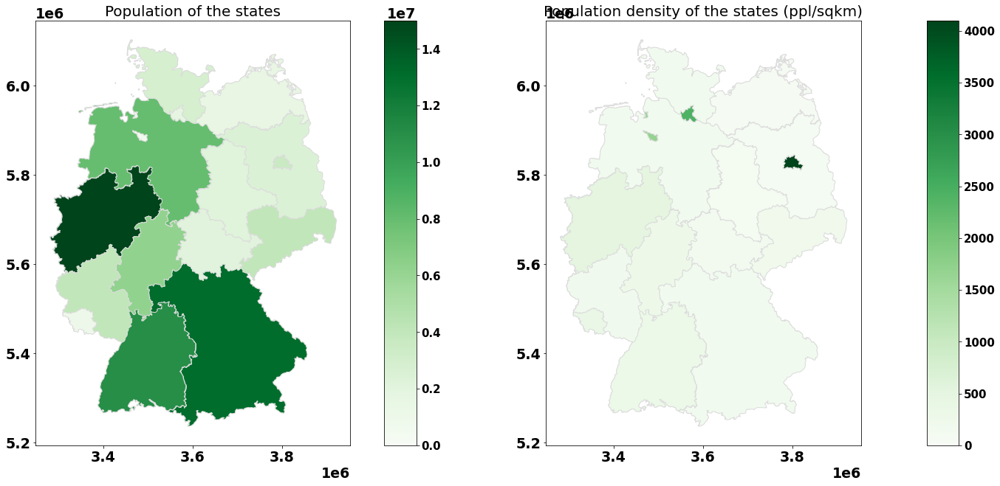

In [111]:
norm_axis1 = 15e6
norm_axis2 = 4.1e3


# map with population
def add_pop_state(state):
    popu = demographics_df[demographics_df.state == state].population.sum()
    #print(popu)
    shape_de[shape_de.state == state].plot(figsize=(10,10),color= cm.Greens(popu/norm_axis1), edgecolor='gainsboro', zorder=3, ax =  ax1)

#map with population density
# for this get the area from the polygon, i.e. geometry
def get_area(state):   
    return shape_de[shape_de.state == state].geometry.area

def add_dens_state(state):
    dens  = demographics_df[demographics_df.state == state].population.sum()/float(get_area(state))/(m2tokm2)
    #print(state , '----' , round((dens)/(m2tokm2),2), 'people/km**2')#properly normalised density people/km**2
    shape_de[shape_de.state == state].plot(figsize=(10,10),color= cm.Greens(dens/norm_axis2), edgecolor='gainsboro', zorder=3, ax =  ax2)
    
    
plt.figure() 

# Create a map
ax1 = plt.axes([0., 0., 1., 2.])
shape_de['geometry'].plot(color='whitesmoke', edgecolor='gainsboro', zorder=3, ax = ax1)
for i in shape_de.state:
    add_pop_state(i)
ax1.set_title('Population of the states', fontsize=20)

# add colorbar
fig = ax1.get_figure()
cax = fig.add_axes([1.1, 0.0, 0.1, 2.0])
norm = mpl.colors.Normalize(vmin=0,vmax=norm_axis1)
sm = plt.cm.ScalarMappable(norm = norm, cmap='Greens')
sm._A = []
cbar = fig.colorbar(sm, cax=cax , ax=ax1)
cbar.ax.tick_params(labelsize=15)
# Create a second map
ax2 = plt.axes([1.6, 0., 1., 2.])
shape_de['geometry'].plot(figsize=(10,10),color='whitesmoke', edgecolor='gainsboro', zorder=3, ax = ax2)
for i in shape_de.state:
    add_dens_state(i)
    
# add colorbar
fig2 = ax2.get_figure()
cax2 = fig.add_axes([2.8, 0.0, 0.1, 2.])
norm2 = mpl.colors.Normalize(vmin=0,vmax=norm_axis2)
sm2 = plt.cm.ScalarMappable(norm=norm2,cmap='Greens')
sm2._A = []
cbar = fig.colorbar(sm2, cax=cax2)
cbar.ax.tick_params(labelsize=15)
ax2.set_title('Population density of the states (ppl/sqkm)', fontsize=20)

plt.show()

# **Cases and deaths per state**

In [112]:
covid_df.shape

(226554, 9)

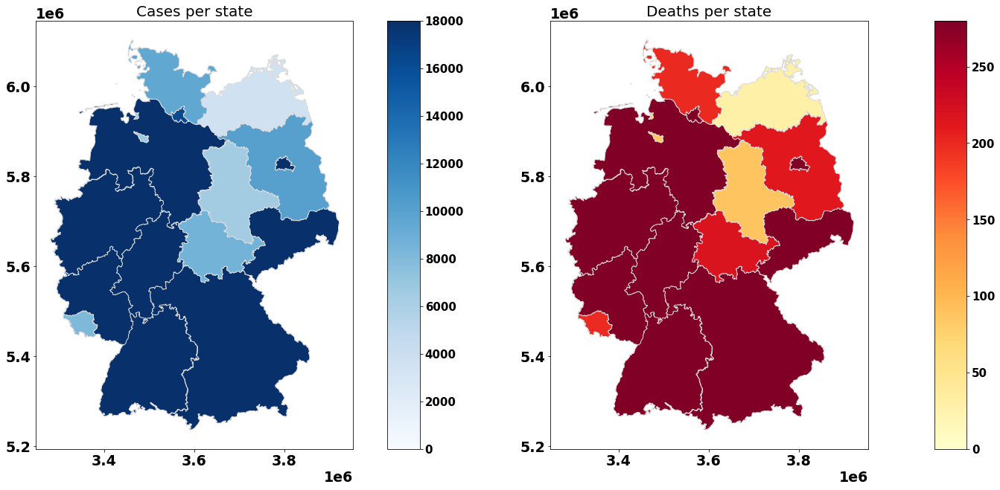

In [113]:
norm_axis1 = 18e3
norm_axis2 = 280

def add_case_per_state(state):
    case = covid_df.loc[covid_df['state'] == state ].cases.sum()
    #print(case)
    shape_de[shape_de.state == state].plot(figsize=(10,10), color= cm.Blues(case/norm_axis1), edgecolor='gainsboro', zorder=3, ax =  ax1)

def add_death_per_state(state):
    death = covid_df.loc[covid_df['state'] == state ].deaths.sum()
    #print(death)
    shape_de[shape_de.state == state].plot(figsize=(10,10), color= cm.YlOrRd(death/norm_axis2), edgecolor='gainsboro', zorder=3, ax = ax2)

plt.figure() 

# Create a map
ax1 = plt.axes([0., 0., 1., 2.])
shape_de['geometry'].plot(color='whitesmoke', edgecolor='gainsboro', zorder=3, ax = ax1)
for i in shape_de.state:
    add_case_per_state(i)
ax1.set_title('Cases per state', fontsize=20)

# add colorbar
fig = ax1.get_figure()
cax = fig.add_axes([1.1, 0.0, 0.1, 2.0])
norm = mpl.colors.Normalize(vmin=0,vmax=norm_axis1)
sm = plt.cm.ScalarMappable(norm = norm, cmap='Blues')
sm._A = []
cbar = fig.colorbar(sm, cax=cax , ax=ax1)
cbar.ax.tick_params(labelsize=15)
# Create a second map
ax2 = plt.axes([1.6, 0., 1., 2.])
shape_de['geometry'].plot(figsize=(10,10),color='whitesmoke', edgecolor='gainsboro', zorder=3, ax = ax2)
for i in shape_de.state:
    add_death_per_state(i)
    
# add colorbar
fig2 = ax2.get_figure()
cax2 = fig.add_axes([2.8, 0.0, 0.1, 2.])
norm2 = mpl.colors.Normalize(vmin=0,vmax=norm_axis2)
sm2 = plt.cm.ScalarMappable(norm=norm2,cmap='YlOrRd')
sm2._A = []
cbar = fig.colorbar(sm2, cax=cax2)
cbar.ax.tick_params(labelsize=15)
ax2.set_title('Deaths per state', fontsize=20)

plt.show()

# **Cases normalised to population**

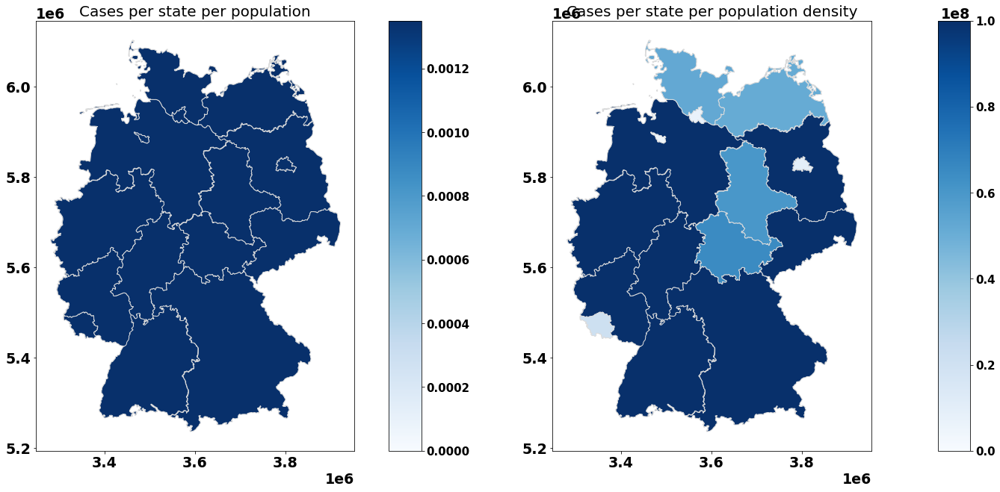

In [114]:
norm_axis1 = 0.00135
norm_axis2 = 1e8


def add_case_per_pop_state(state):
    case_norm = covid_df.loc[covid_df['state'] == state ].cases.sum() / demographics_df[demographics_df.state == state].population.sum()
    #print(case_norm)
    shape_de[shape_de.state == state].plot(figsize=(10,10), color= cm.Blues(case_norm/norm_axis1), edgecolor='gainsboro', zorder=3, ax =  ax1)

def get_area(state):   
    return shape_de[shape_de.state == state].geometry.area
    
def add_case_per_dens_state(state):
    case_dens = covid_df.loc[covid_df['state'] == state ].cases.sum() / (demographics_df[demographics_df.state == state].population.sum()/float(get_area(state)))
    #print(case_dens)
    shape_de[shape_de.state == state].plot(figsize=(10,10), color= cm.Blues(case_dens/norm_axis2), edgecolor='gainsboro', zorder=3, ax =  ax2)

    

plt.figure() 

# Create a map
ax1 = plt.axes([0., 0., 1., 2.])
shape_de['geometry'].plot(color='whitesmoke', edgecolor='gainsboro', zorder=3, ax = ax1)
for i in shape_de.state:
    add_case_per_pop_state(i)
ax1.set_title('Cases per state per population', fontsize=20)

# add colorbar
fig = ax1.get_figure()
cax = fig.add_axes([1.1, 0.0, 0.1, 2.0])
norm = mpl.colors.Normalize(vmin=0,vmax=norm_axis1)
sm = plt.cm.ScalarMappable(norm = norm, cmap='Blues')
sm._A = []
cbar = fig.colorbar(sm, cax=cax , ax=ax1)
cbar.ax.tick_params(labelsize=15)
# Create a second map
ax2 = plt.axes([1.6, 0., 1., 2.])
shape_de['geometry'].plot(figsize=(10,10),color='whitesmoke', edgecolor='gainsboro', zorder=3, ax = ax2)
for i in shape_de.state:
    add_case_per_dens_state(i)
    
# add colorbar
fig2 = ax2.get_figure()
cax2 = fig.add_axes([2.8, 0.0, 0.1, 2.])
norm2 = mpl.colors.Normalize(vmin=0,vmax=norm_axis2)
sm2 = plt.cm.ScalarMappable(norm=norm2,cmap='Blues')
sm2._A = []
cbar = fig.colorbar(sm2, cax=cax2)
cbar.ax.tick_params(labelsize=15)
ax2.set_title('Cases per state per population density', fontsize=20)

plt.show()

# **Deaths normalised to population**

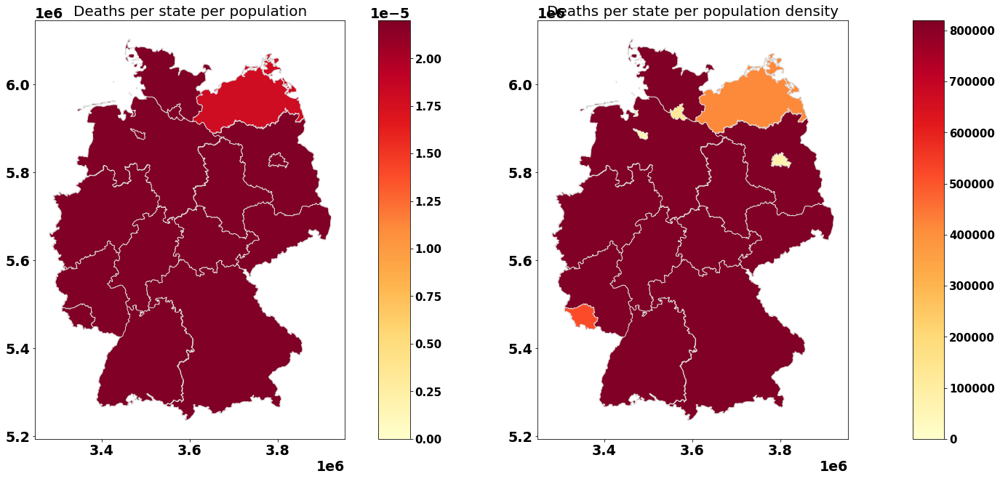

In [115]:
norm_axis1 = 2.2e-05
norm_axis2 = 8.2e5


def add_death_per_pop_state(state):
    death_norm = covid_df.loc[covid_df['state'] == state ].deaths.sum() / demographics_df[demographics_df.state == state].population.sum()
    #print(death_norm)
    shape_de[shape_de.state == state].plot(figsize=(10,10), color= cm.YlOrRd(death_norm/norm_axis1), edgecolor='gainsboro', zorder=3, ax =  ax1)

def get_area(state):   
    return shape_de[shape_de.state == state].geometry.area
    
def add_death_per_dens_state(state):
    death_dens = covid_df.loc[covid_df['state'] == state ].deaths.sum() / (demographics_df[demographics_df.state == state].population.sum()/float(get_area(state)))
    #print(death_dens)
    shape_de[shape_de.state == state].plot(figsize=(10,10), color= cm.YlOrRd(death_dens/norm_axis2), edgecolor='gainsboro', zorder=3, ax =  ax2)

    

plt.figure() 

# Create a map
ax1 = plt.axes([0., 0., 1., 2.])
shape_de['geometry'].plot(color='whitesmoke', edgecolor='gainsboro', zorder=3, ax = ax1)
for i in shape_de.state:
    add_death_per_pop_state(i)
ax1.set_title('Deaths per state per population', fontsize=20)

# add colorbar
fig = ax1.get_figure()
cax = fig.add_axes([1.1, 0.0, 0.1, 2.0])
norm = mpl.colors.Normalize(vmin=0,vmax=norm_axis1)
sm = plt.cm.ScalarMappable(norm = norm, cmap='YlOrRd')
sm._A = []
cbar = fig.colorbar(sm, cax=cax , ax=ax1)
cbar.ax.tick_params(labelsize=15)
# Create a second map
ax2 = plt.axes([1.6, 0., 1., 2.])
shape_de['geometry'].plot(figsize=(10,10),color='whitesmoke', edgecolor='gainsboro', zorder=3, ax = ax2)
for i in shape_de.state:
    add_death_per_dens_state(i)
    
# add colorbar
fig2 = ax2.get_figure()
cax2 = fig.add_axes([2.8, 0.0, 0.1, 2.])
norm2 = mpl.colors.Normalize(vmin=0,vmax=norm_axis2)
sm2 = plt.cm.ScalarMappable(norm=norm2,cmap='YlOrRd')
sm2._A = []
cbar = fig.colorbar(sm2, cax=cax2)
cbar.ax.tick_params(labelsize=15)
ax2.set_title('Deaths per state per population density', fontsize=20)

plt.show()

# Correlation Matrix

In [116]:
corr_mat_fig = go.Figure()

corr_mat_fig = go.Figure(data=go.Splom(
                dimensions=[dict(label='cases',
                                 values=base_stats['cases']),
                            dict(label='Active',
                                 values=base_stats['Active']),
                            dict(label='recovered',
                                 values=base_stats['recovered']),
                            dict(label='deaths',
                                 values=base_stats['deaths'])],
                text=base_stats['dates'],
    diagonal_visible=False,
    marker=dict(color='red',
                showscale=False, # colors encode categorical variables
                line_color='white', line_width=0.5)
                ))


corr_mat_fig.update_layout(
    #height=600, width=600, 
                                     title_text="Correlation Matrix for types of Cases",
                                     title_x=0.5, title_font_size=15, paper_bgcolor="mintcream",
                                     legend=dict(orientation='h',yanchor='top',y=1.12,xanchor='right',x=1))

corr_mat_fig.show()


In [117]:
covid_df.head()

,state,county,age_group,gender,date,cases,deaths,recovered,Active
0,Baden-Wuerttemberg,LK Alb-Donau-Kreis,00-04,F,2020-03-27,1,0,1,0
1,Baden-Wuerttemberg,LK Alb-Donau-Kreis,00-04,F,2020-03-28,1,0,1,0
2,Baden-Wuerttemberg,LK Alb-Donau-Kreis,00-04,F,2020-04-03,1,0,1,0
3,Baden-Wuerttemberg,LK Alb-Donau-Kreis,00-04,F,2020-10-18,1,0,0,1
4,Baden-Wuerttemberg,LK Alb-Donau-Kreis,00-04,F,2020-10-22,1,0,0,1


In [120]:
covid_df.drop(["county","date","deaths","Active"],axis=1,inplace=True)
covid_df.head()

,state,age_group,gender,cases,recovered
0,Baden-Wuerttemberg,00-04,F,1,1
1,Baden-Wuerttemberg,00-04,F,1,1
2,Baden-Wuerttemberg,00-04,F,1,1
3,Baden-Wuerttemberg,00-04,F,1,0
4,Baden-Wuerttemberg,00-04,F,1,0


In [121]:
covid_df = covid_df.groupby(["age_group","state","gender"]).sum()

In [122]:
covid_df.reset_index(inplace=True)

In [123]:
covid_df["ratio"] = covid_df["recovered"]/covid_df["cases"]
covid_df.head()

,age_group,state,gender,cases,recovered,ratio
0,00-04,Baden-Wuerttemberg,F,678,417,0.615044
1,00-04,Baden-Wuerttemberg,M,793,496,0.625473
2,00-04,Bayern,F,1139,793,0.696225
3,00-04,Bayern,M,1271,874,0.687648
4,00-04,Berlin,F,375,251,0.669333


In [124]:
covid_df.loc[covid_df["ratio"]<=0.5,"ratio"] = 0
covid_df.loc[covid_df["ratio"]>0.5,"ratio"] = 1
covid_df.head()

,age_group,state,gender,cases,recovered,ratio
0,00-04,Baden-Wuerttemberg,F,678,417,1.0
1,00-04,Baden-Wuerttemberg,M,793,496,1.0
2,00-04,Bayern,F,1139,793,1.0
3,00-04,Bayern,M,1271,874,1.0
4,00-04,Berlin,F,375,251,1.0


In [125]:
covid_df.ratio.value_counts()

1.0    174
0.0     18
Name: ratio, dtype: int64

In [126]:
covid_df.drop(["cases","recovered"],axis=1,inplace=True)

In [127]:
cat_df = covid_df[["state","age_group","gender"]]

In [128]:
cat_df = pd.get_dummies(cat_df, drop_first=True)

In [129]:
covid_df.drop(["state","age_group","gender"],axis=1,inplace=True)

In [130]:
y = covid_df["ratio"]
X = covid_df.drop(["ratio"], axis = 1)
cols = X.columns
index = X.index

In [131]:
X = pd.DataFrame(X,columns=cols,index=index)
X = pd.concat([X,cat_df],axis=1)

In [132]:
from imblearn.over_sampling import RandomOverSampler

ros = RandomOverSampler()
X, y = ros.fit_sample(X, y)


In [133]:
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, 
                                                    test_size=0.20, 
                                                    random_state=12345)

In [134]:
from sklearn.linear_model import LogisticRegression  
from sklearn.neighbors import KNeighborsClassifier  
from sklearn.svm import SVC
from sklearn.tree import DecisionTreeClassifier 
from sklearn.ensemble import RandomForestClassifier
from lightgbm import LGBMClassifier
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.model_selection import train_test_split
from sklearn import preprocessing
from sklearn.metrics import accuracy_score
from xgboost import XGBClassifier
from sklearn.model_selection import KFold
from sklearn.model_selection import cross_val_score, GridSearchCV


# Tum modellerin train validasyon skorları

models = []
models.append(('LR', LogisticRegression( random_state = 12345)))
models.append(('KNN', KNeighborsClassifier()))
models.append(('CART', DecisionTreeClassifier( random_state = 12345)))
models.append(('RF', RandomForestClassifier( random_state = 12345)))
models.append(('SVM', SVC(gamma='auto', random_state = 12345)))
models.append(('XGB', GradientBoostingClassifier( random_state = 12345)))
models.append(("LightGBM", LGBMClassifier( random_state = 12345)))

# evaluate each model in turn
results = []
names = []

In [135]:
for name, model in models:
    
        base = model.fit(X_train,y_train)
        y_pred = base.predict(X_test)
        acc_score = accuracy_score(y_test, y_pred)
        results.append(acc_score)
        names.append(name)
        msg = "%s: %f" % (name, acc_score)
        print(msg)

LR: 0.942857
KNN: 0.871429
CART: 0.957143
RF: 0.985714
SVM: 0.928571
XGB: 0.971429
LightGBM: 0.942857


In [136]:
from sklearn.metrics import  accuracy_score, f1_score, precision_score,confusion_matrix, recall_score, roc_auc_score
y_pred = model.predict(X_test)
cm_xgb = confusion_matrix(y_test, y_pred=y_pred)

In [137]:
TP = cm_xgb[1, 1]
TN = cm_xgb[0, 0]
FP = cm_xgb[0, 1]
FN = cm_xgb[1, 0]

In [138]:
from matplotlib import rc,rcParams
def plot_confusion_matrix(cm, classes,
                          title='Confusion matrix',
                          cmap=plt.cm.Blues):

    plt.rcParams.update({'font.size': 19})
    plt.imshow(cm, interpolation='nearest', cmap=cmap)
    plt.title(title,fontdict={'size':'16'})
    plt.colorbar()
    tick_marks = np.arange(len(classes))
    plt.xticks(tick_marks, classes, rotation=45,fontsize=12,color="blue")
    plt.yticks(tick_marks, classes,fontsize=12,color="blue")
    rc('font', weight='bold')
    fmt = '.1f'
    thresh = cm.max()
    for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
        plt.text(j, i, format(cm[i, j], fmt),
                 horizontalalignment="center",
                 color="red")

    plt.ylabel('True label',fontdict={'size':'16'})
    plt.xlabel('Predicted label',fontdict={'size':'16'})
    plt.tight_layout()

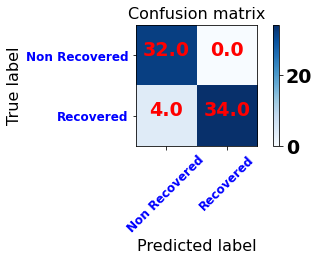

In [139]:
import itertools
plot_confusion_matrix(confusion_matrix(y_test, y_pred=y_pred), classes=['Non Recovered','Recovered'],
                      title='Confusion matrix')

In [141]:
clf = DecisionTreeClassifier( random_state = 12345)
clf.fit(X_train, y_train)
clf.predict(X_test)

array([1., 0., 1., 0., 1., 0., 1., 1., 1., 1., 1., 0., 0., 1., 0., 1., 1.,
       0., 1., 1., 1., 0., 1., 1., 1., 1., 1., 1., 0., 0., 0., 1., 1., 0.,
       0., 0., 1., 0., 0., 0., 0., 0., 1., 0., 1., 1., 0., 1., 1., 0., 0.,
       1., 0., 0., 0., 0., 1., 1., 0., 1., 1., 0., 1., 0., 0., 1., 0., 0.,
       0., 0.])

[Text(212.04, 211.04470588235293, 'X[19] <= 0.5\ngini = 0.5\nsamples = 278\nvalue = [142, 136]'),
 Text(133.92000000000002, 198.25411764705882, 'X[11] <= 0.5\ngini = 0.346\nsamples = 157\nvalue = [35, 122]'),
 Text(111.6, 185.4635294117647, 'gini = 0.0\nsamples = 117\nvalue = [0, 117]'),
 Text(156.24, 185.4635294117647, 'X[15] <= 0.5\ngini = 0.219\nsamples = 40\nvalue = [35, 5]'),
 Text(133.92000000000002, 172.6729411764706, 'X[16] <= 0.5\ngini = 0.145\nsamples = 38\nvalue = [35, 3]'),
 Text(111.6, 159.88235294117646, 'X[17] <= 0.5\ngini = 0.102\nsamples = 37\nvalue = [35, 2]'),
 Text(89.28, 147.09176470588235, 'X[18] <= 0.5\ngini = 0.208\nsamples = 17\nvalue = [15, 2]'),
 Text(66.96000000000001, 134.30117647058825, 'gini = 0.0\nsamples = 2\nvalue = [0, 2]'),
 Text(111.6, 134.30117647058825, 'gini = 0.0\nsamples = 15\nvalue = [15, 0]'),
 Text(133.92000000000002, 147.09176470588235, 'gini = 0.0\nsamples = 20\nvalue = [20, 0]'),
 Text(156.24, 159.88235294117646, 'gini = 0.0\nsamples = 1\

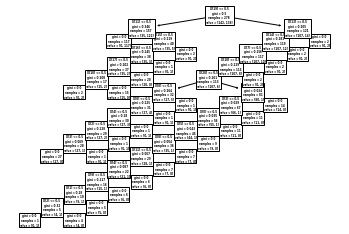

In [142]:
from sklearn import tree
tree.plot_tree(clf)

In [146]:
tree.export_graphviz(clf,
                     out_file="tree.dot",
                     feature_names = X.columns, 
                     class_names=["Not Recovered","Recovered"],
                     filled = True)